In [285]:
import pandas as pd
%matplotlib inline
pd.set_option('display.float_format', lambda x: '%.3f' % x)
import numpy as np
import matplotlib.pyplot as plt
from bokeh.plotting import figure, output_file
from bokeh.charts import Bar, output_file, show
import bokeh.plotting as bplt
from bokeh.palettes import Dark2_5 as palette
from bokeh.models import Label, Title
import itertools  
from bokeh.layouts import gridplot,row,column

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

from bokeh.io import output_notebook
plt.style.use('ggplot')
output_notebook()

Loading BokehJS ...

In [124]:
directory = '/home/georgeha/repos/midas_exps/streaming/k-means/spark/'

def plot_producer(producer_dir,producer_filename,p_number,fig_count,txt):
    
    rates =pd.read_csv(directory + producer_dir + producer_filename)
    x_values = rates['Num_Messages'].tolist()
    y_values = rates['KB/sec'].tolist()
    
    f = plt.figure()
    plt.xlim(0,12500)
    plt.plot(x_values,y_values)
    plt.ylabel('KB/s')
    plt.xlabel('Msg number')
    plt.title("Producer " + str(p_number)+ "  throughput")
    text = 'Figure ' + str(fig_count) + ' : ' + txt
    f.text(.20, .02, text, ha='center')
    
    return (x_values,y_values)

## Function for reading producer's data and then plotting  it's data
#example:
# a = plot_producer('5k-4-1-1-20170912-222705/producers/producer_2/','stdout-20170912-222716.csv',3,25)

In [125]:
directory = '/home/georgeha/repos/midas_exps/streaming/k-means/spark/'
def plot_scheduling_and_Total_Delay(spark_metrics_dir,fig_count):
    
    metrics = pd.read_csv(directory + spark_metrics_dir ,skipinitialspace=True)
    scheduling_delay = metrics['SchedulingDelay'].tolist()    # TODO: milisec to sec
    TotalDelay = metrics['TotalDelay'].tolist()
    x_values = range(0,metrics['SchedulingDelay'].count())
    # create a new plot with a title and axis labels
    p = figure(title="Figure " + str(fig_count) + ": Spark Scheduling delay", x_axis_label='miniBatch Number', y_axis_label='Delay in milisec')
    # add a line renderer with legend and line thickness
    p.line(x_values, scheduling_delay, legend="Scheduling Delay", line_width=2,line_color="red")
    p.line(x_values,TotalDelay,legend="Total Delay", line_width=2)
    #throughput = (TotalDelay - scheduling_delay)/metrics['NumberRecords']
    bplt.show(p)
    return (x_values,scheduling_delay)



In [126]:
directory = '/home/georgeha/repos/midas_exps/streaming/k-means/spark/'

def plot_throughput_per_mini_batch(spark_metrics_dir,fig_count):
    
    metrics = pd.read_csv(directory + spark_metrics_dir ,skipinitialspace=True)
    scheduling_delay = metrics['SchedulingDelay']
    TotalDelay = metrics['TotalDelay']
    x_values = range(0,scheduling_delay.count())    
    throughput = 60*metrics['NumberRecords']/(TotalDelay - scheduling_delay)      # check That
    # create a new plot with a title and axis labels
    p = figure(title="Figure " + str(fig_count) + " : Spark throughput/mini batch  - batch=60sec", x_axis_label='miniBatch Number', y_axis_label='records/batch')

    # add a line renderer with legend and line thickness
    p.line(x_values, throughput.tolist(), legend="Throughput", line_width=2,line_color="green")

    # show the results
    bplt.show(p)
    return  (x_values,throughput.tolist())

In [127]:
#throughput = lastReceivedBatch_records/ (lastReceivedBatch_processingEndTime-lastReceivedBatch_processingStartTime) <br>
directory = '/home/georgeha/repos/midas_exps/streaming/k-means/spark/'
def plot_spark_throughput_per_timeline(spark_app_dir,spark_app, shift_time,fig_count):
    spark_app = directory + spark_app_dir + spark_app
    lastReceivedBatch_processingEndTime_dir = spark_app +'.driver.PythonSparkStreamingKafkaKMeans.StreamingMetrics.streaming.lastReceivedBatch_processingEndTime.csv'
    lastReceivedBatch_processingStartTime_dir = spark_app + '.driver.PythonSparkStreamingKafkaKMeans.StreamingMetrics.streaming.lastReceivedBatch_processingStartTime.csv'
    lastReceivedBatch_records_dir = spark_app + '.driver.PythonSparkStreamingKafkaKMeans.StreamingMetrics.streaming.lastReceivedBatch_records.csv'

    lastReceivedBatch_processingEndTime  = pd.read_csv(lastReceivedBatch_processingEndTime_dir ,skipinitialspace=True)
    lastReceivedBatch_processingStartTime = pd.read_csv(lastReceivedBatch_processingStartTime_dir,skipinitialspace=True)
    lastReceivedBatch_records = pd.read_csv(lastReceivedBatch_records_dir,skipinitialspace=True)
    # throughput  - check the 1000
    throughput = 1000*lastReceivedBatch_records/(lastReceivedBatch_processingEndTime-lastReceivedBatch_processingStartTime)
    throughput = throughput['value']
    throughput = throughput.tolist()
    
    for i in xrange(len(throughput)):
        if throughput[i]<0:
            throughput[i]=0    
            
    x_values = lastReceivedBatch_records
    x_values = x_values['t']
    x_values = x_values.tolist()

    for i in xrange(len(x_values)):
        x_values[i] = x_values[i] - shift_time
        
    p = figure(title="Figure "+ str(fig_count) + " Spark throughput per timeline", x_axis_label='Time ( in sec)', y_axis_label='Throughput (in Records/secs)')

    # add a line renderer with legend and line thickness
    p.circle(x_values, throughput, legend="Scheduling Delay", line_width=2)
    
    # show the results
    bplt.show(p)

    return (x_values,throughput)
    
    

# #1 Spark K-means  1-1-1 (p-b-c)-20170906-150755-8k

throughput = lastReceivedBatch_records/ (lastReceivedBatch_processingEndTime-lastReceivedBatch_processingStartTime) <br>
Parameters: Streaming window: 60 seconds, Number of cluster centroids, Number  of data points <br>

In [121]:
#a = plot_spark_throughput_per_timeline('1-1-1-20170906-150755/spark-consumer','/app-20170906150756-0000',1504728486,50)

###### Spark throughput / per minibatch  and Scheduling delay/minibatch

In [284]:
sched_111_20170906_150755 = plot_scheduling_and_Total_Delay('1-1-1-20170906-150755/producers/spark-metrics-20170906-150755.csv',23)

In [129]:
aa = plot_throughput_per_mini_batch('1-1-1-20170906-150755/producers/spark-metrics-20170906-150755.csv',24)

### Producers

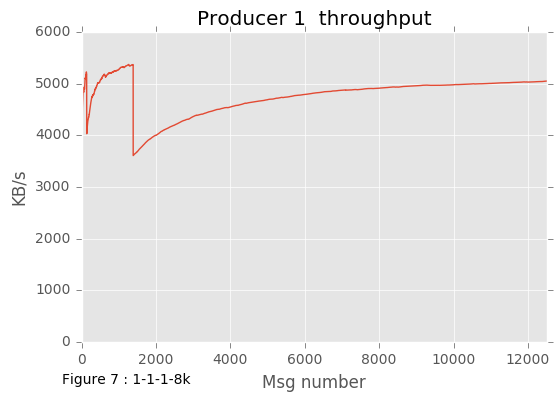

In [65]:
p_111_1_8k_20170906_150755 = plot_producer('1-1-1-20170906-150755/producers/','stdout-20170906-150755.csv',1,7,'1-1-1-8k')

# #2 K-means : 4-1-1 (p-b-c)

In [122]:
#aa = plot_spark_throughput_per_timeline('4-1-1-20170907-110405/spark_consumer','/app-20170907110406-0000',1504800256,2)

###### Spark throughput / per minibatch  and Scheduling delay/minibatch

In [160]:
schedu_411_20170907_110405= plot_scheduling_and_Total_Delay('4-1-1-20170907-110405/producers/producer_1/spark-metrics-20170907-110405.csv',25)

In [161]:
minibatch_411_20170907_110405 = plot_throughput_per_mini_batch('4-1-1-20170907-110405/producers/producer_1/spark-metrics-20170907-110405.csv',26)

#### Producers

In [85]:
#p_411_1_8k_20170907_110405 = plot_producer('4-1-1-20170907-110405/producers/producer_1/','stdout-20170907-110253.csv',1,8,'4-1-1-8k')
#p_411_2_8k_20170907_110405= plot_producer('4-1-1-20170907-110405/producers/producer_2/','stdout-20170907-110408.csv',2,9,'4-1-1-8k')
#p_411_3_8k_20170907_110405 = plot_producer('4-1-1-20170907-110405/producers/producer_3/','stdout-20170907-110410.csv',3,10,'4-1-1-8k')
#p_411_4_8k_20170907_110405 = plot_producer('4-1-1-20170907-110405/producers/producer_4/','stdout-20170907-110411.csv',4,11,'4-1-1-8k')

##### producer rates comparison  of 4-1-1 -8k

Total Average throughput is: 32191.403 KB/s 
Average Throughput/producer is: 8047.851 KB/s 


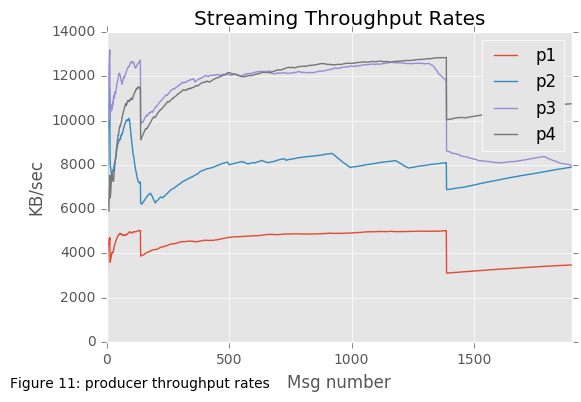

In [245]:
f = plt.figure()
plt.plot(p_411_1_8k_20170907_110405[0],p_411_1_8k_20170907_110405[1],label='p1') 
plt.plot(p_411_2_8k_20170907_110405[0],p_411_2_8k_20170907_110405[1],label='p2') 
plt.plot(p_411_3_8k_20170907_110405[0],p_411_3_8k_20170907_110405[1],label='p3') 
plt.plot(p_411_4_8k_20170907_110405[0],p_411_4_8k_20170907_110405[1],label='p4')

plt.xlim(0,1900)
plt.legend()
plt.title('Streaming Throughput Rates')
plt.ylabel('KB/sec')
plt.xlabel('Msg number')

text = 'Figure 11: producer throughput rates'
f.text(.18, .01, text, ha='center')


total_producer_throughput_8k_20170907_110405 = sum(p_411_1_8k_20170907_110405[1] +p_411_2_8k_20170907_110405[1] + p_411_3_8k_20170907_110405[1] + p_411_4_8k_20170907_110405[1])

total_producer_throughput_8k_20170907_110405 /= len(p_411_1_8k_20170907_110405[1])

print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_8k_20170907_110405
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_8k_20170907_110405/4)

# #3 K-means : 8-1-1-20170907-163836-8k (p-b-c) 

In [130]:
aa = plot_spark_throughput_per_timeline('8-1-1-20170907-163836/spark-consumer','/app-20170907163838-0000',1504820328,3)

In [99]:
#p_811_1_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_1/','stdout-20170907-163849.csv',1,12,'8-1-1-8k')
#p_811_2_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_2/','stdout-20170907-163837.csv',2,13,'8-1-1-8k')
#p_811_3_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_3/','stdout-20170907-163838.csv',3,14,'8-1-1-8k')
#p_811_4_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_4/','stdout-20170907-163840.csv',4,15,'8-1-1-8k')
#p_811_5_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_5/','stdout-20170907-163841.csv',5,16,'8-1-1-8k')
#p_811_6_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_6/','stdout-20170907-163842.csv',6,17,'8-1-1-8k')
#p_811_7_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_7/','stdout-20170907-163844.csv',7,18,'8-1-1-8k')
#p_811_8_8k_20170906_150755 = plot_producer('8-1-1-20170907-163836/producers/producer_8/','stdout-20170907-163846.csv',8,19,'8-1-1-8k')


##### producer rates comparison  of 8-1-1 -8k


Total Average throughput is: 73831.685 KB/s 
Average Throughput/producer is: 9228.961 KB/s 


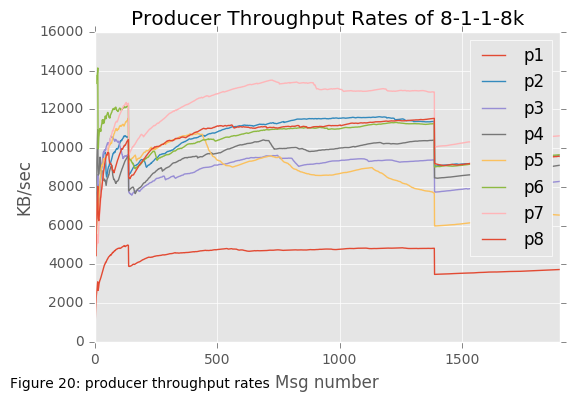

In [247]:
f = plt.figure()
plt.plot(p_811_1_8k_20170906_150755[0],p_811_1_8k_20170906_150755[1],label='p1') 
plt.plot(p_811_2_8k_20170906_150755[0],p_811_2_8k_20170906_150755[1],label='p2') 
plt.plot(p_811_3_8k_20170906_150755[0],p_811_3_8k_20170906_150755[1],label='p3') 
plt.plot(p_811_4_8k_20170906_150755[0],p_811_4_8k_20170906_150755[1],label='p4')
plt.plot(p_811_5_8k_20170906_150755[0],p_811_5_8k_20170906_150755[1],label='p5') 
plt.plot(p_811_6_8k_20170906_150755[0],p_811_6_8k_20170906_150755[1],label='p6') 
plt.plot(p_811_7_8k_20170906_150755[0],p_811_7_8k_20170906_150755[1],label='p7') 
plt.plot(p_811_8_8k_20170906_150755[0],p_811_8_8k_20170906_150755[1],label='p8')

plt.xlim(0,1900)
plt.legend()
plt.title('Producer Throughput Rates of 8-1-1-8k')
plt.ylabel('KB/sec')
plt.xlabel('Msg number')

text = 'Figure 20: producer throughput rates'
f.text(.20, .01, text, ha='center')


total_producer_throughput_8k_20170906_150755 = sum(p_811_1_8k_20170906_150755[1] +p_811_2_8k_20170906_150755[1] + p_811_3_8k_20170906_150755[1] + p_811_4_8k_20170906_150755[1])
total_producer_throughput_8k_20170906_150755 += sum(p_811_5_8k_20170906_150755[1] +p_811_6_8k_20170906_150755[1] + p_811_7_8k_20170906_150755[1] + p_811_8_8k_20170906_150755[1])

total_producer_throughput_8k_20170906_150755 /= len(p_811_8_8k_20170906_150755[1])

print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_8k_20170906_150755
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_8k_20170906_150755/8)

# #4 K-means : 1-1-1 (p-b-c)   - 5K

In [287]:
#aa = plot_spark_throughput_per_timeline('5k-1-1-1-20170907-192211/spark-consumer','/app-20170907192212-0000',1504830142,4)

#### Producers

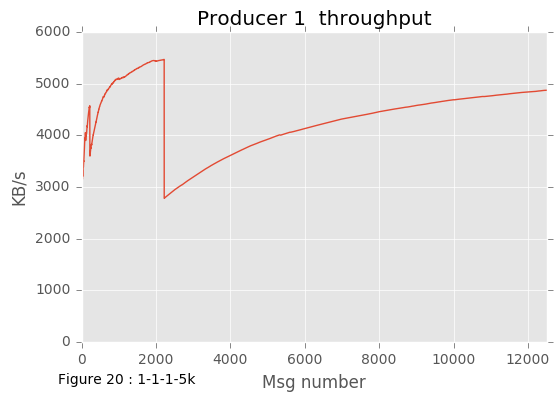

In [133]:
p111_1_5k_20170907_192211 = plot_producer('5k-1-1-1-20170907-192211/producers/producer_1/','stdout-20170907-192218.csv',1,20,'1-1-1-5k')

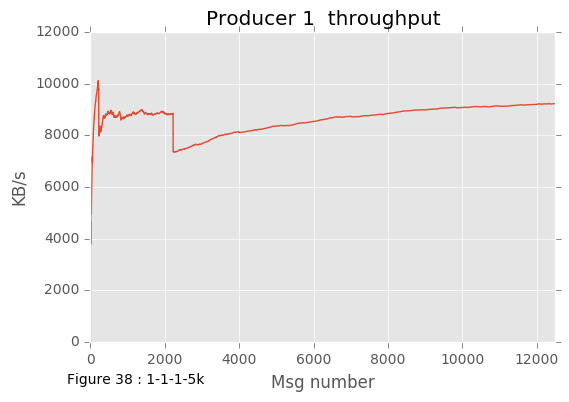

In [261]:
 p111_1_5k_20170921_154328 = plot_producer('5k-1-1-1-20170921-154328/producers/producer_1/','stdout-20170921-154334.csv',1,38,'1-1-1-5k')

In [291]:
schedu_411_20170921_154328 = plot_scheduling_and_Total_Delay('5k-1-1-1-20170921-154328/spark-metrics-20170921-154328.csv',42)

# #5 K-means : 2-1-1 (p-b-c)   - 5K

In [135]:
aa = plot_spark_throughput_per_timeline('5k-2-1-1-20170908-093541/spark-consumer','/app-20170908093542-0000',1504881372,5)

In [119]:
#p_211_1_5k_20170908_093541 = plot_producer('5k-2-1-1-20170908-093541/producers/producer_1/','stdout-20170908-093546.csv',1,21,'2-1-1-5k')
#p_211_2_5k_20170908_093541 = plot_producer('5k-2-1-1-20170908-093541/producers/producer_2/','stdout-20170908-093538.csv',2,22,'2-1-1-5k')

##### producer rates comparison  of 2-1-1 -5k


Total Average throughput is: 12446.559 KB/s 
Average Throughput/producer is: 6223.279 KB/s 


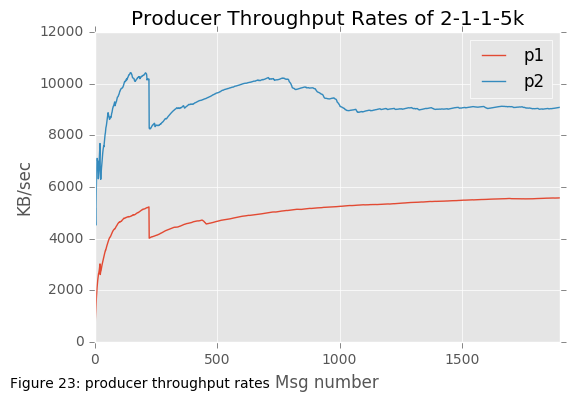

In [162]:
f = plt.figure()
plt.plot(p_211_1_5k_20170908_093541[0],p_211_1_5k_20170908_093541[1],label='p1') 
plt.plot(p_211_2_5k_20170908_093541[0],p_211_2_5k_20170908_093541[1],label='p2') 


plt.xlim(0,1900)
plt.legend()
plt.title('Producer Throughput Rates of 2-1-1-5k')
plt.ylabel('KB/sec')
plt.xlabel('Msg number')

text = 'Figure 23: producer throughput rates'
f.text(.20, .01, text, ha='center')

total_producer_throughput_5k_20170908_093541 = sum(p_211_1_5k_20170908_093541[1] +p_211_2_5k_20170908_093541[1])

total_producer_throughput_5k_20170908_093541 /= len(p_211_1_5k_20170908_093541[1])
print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_5k_20170908_093541
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_5k_20170908_093541/2)

# Spark throughput rate   Comparison 

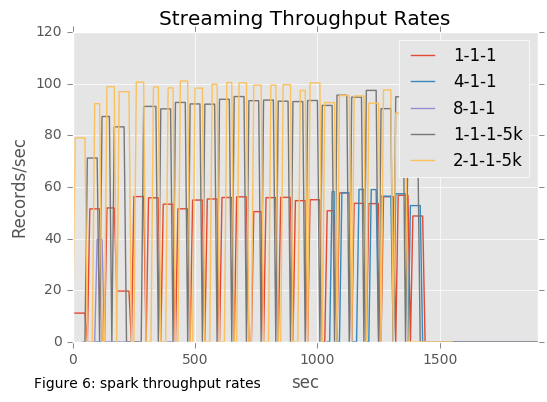

In [122]:
f = plt.figure()
plt.plot(x_1_1_1,y_1_1_1,label='1-1-1') 
plt.plot(x_4_1_1,y_4_1_1,label='4-1-1') 
plt.plot(x_8_1_1,y_8_1_1,label='8-1-1') 
plt.plot(x_1_1_1_5k,y_1_1_1_5k,label='1-1-1-5k')
plt.plot(x_2_1_1_5k,y_2_1_1_5k,label='2-1-1-5k')
plt.xlim(0,1900)
plt.legend()
plt.title('Streaming Throughput Rates')
plt.ylabel('Records/sec')
plt.xlabel('sec')

text = 'Figure 6: spark throughput rates'
f.text(.25, .01, text, ha='center')
#f.savefig('throughput.pdf')

Below are the older experiments

# #6 K-means : 2-1-2-20170810-092604-8k (p-b-c)

In [136]:
a = plot_spark_throughput_per_timeline('2-1-2-20170810-092604/spark-consumer','/app-20170810092602-0000',1502375172,00)

## #7 K-means : 4-1-1 -8k (p-b-c)

In [137]:
a = plot_spark_throughput_per_timeline('4-1-1-20170901-143355/spark_consumer','/app-20170901143342-0000',1504294432,00)

## #8 K-means : 8-1-1 (p-b-c)

In [138]:
a = plot_spark_throughput_per_timeline('8-1-1-20170901-185950/spark-consumer','/app-20170901185951-0000',1504310402,00)

## Comparing throughput numbers 

throughput = lastReceivedBatch_records/ (lastReceivedBatch_processingEndTime-lastReceivedBatch_processingStartTime) <br>


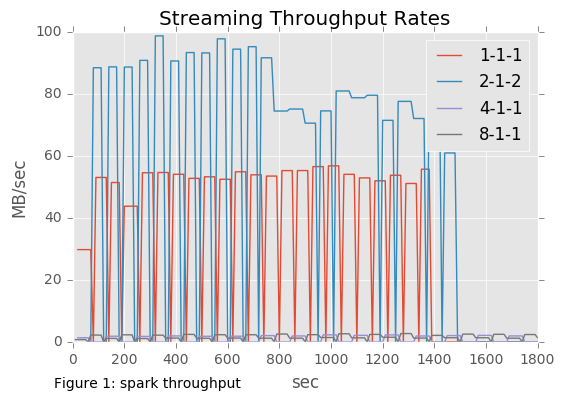

In [57]:
f = plt.figure()
plt.plot(x_1_1_1,y_1_1_1,label='1-1-1') 
plt.plot(x_2_1_2,y_2_1_2,label='2-1-2') 
plt.plot(x_4_1_1,y_4_1_1,label='4-1-1') 
plt.plot(x_8_1_1,y_8_1_1,label='8-1-1') 
plt.xlim(0,1800)
plt.legend()
plt.title('Streaming Throughput Rates')
plt.ylabel('MB/sec')
plt.xlabel('sec')

text = 'Figure 1: spark throughput'
f.text(.25, .01, text, ha='center')
#f.savefig('throughput.pdf')

##### New Data

In [ ]:
f = plt.figure()
plt.plot(x_1_1_1,y_1_1_1,label='1-1-1') 
plt.plot(x_2_1_2,y_2_1_2,label='2-1-2') 
plt.plot(x_4_1_1,y_4_1_1,label='4-1-1') 
plt.plot(x_8_1_1,y_8_1_1,label='8-1-1') 
plt.xlim(0,1800)
plt.legend()
plt.title('Streaming Throughput Rates')
plt.ylabel('MB/sec')
plt.xlabel('sec')

text = 'Figure 2: spark throughput'
f.text(.25, .01, text, ha='center')
#f.savefig('throughput.pdf')

## #9 K-means : 5k-4-1-1 (p-b-c)

#### Producers

In [142]:
#p_411_1_5k_20170912_222705 = plot_producer('5k-4-1-1-20170912-222705/producers/producer_1/','stdout-20170912-222712.csv',1,24,'5k-4-1-1')
#p_411_2_5k_20170912_222705 = plot_producer('5k-4-1-1-20170912-222705/producers/producer_2/','stdout-20170912-222716.csv',2,25,'5k-4-1-1')
#p_411_3_5k_20170912_222705 = plot_producer('5k-4-1-1-20170912-222705/producers/producer_3/','stdout-20170912-222718.csv',3,26,'5k-4-1-1')
#p_411_4_5k_20170912_222705 = plot_producer('5k-4-1-1-20170912-222705/producers/producer_4/','stdout-20170912-222720.csv',4,27,'5k-4-1-1')

In [143]:
# create a new plot with a title and axis labels
p = figure(title="Figure 28: 5k-4-1-1 Producers throughput", x_axis_label='Msg number', y_axis_label='KB/s')

# add a line renderer with legend and line thickness
p.line(p_411_1_5k_20170912_222705[0],p_411_1_5k_20170912_222705[1], legend="producer_1", line_width=2,line_color="red")
p.line(p_411_2_5k_20170912_222705[0],p_411_2_5k_20170912_222705[1],legend="producer_2", line_width=2)
p.line(p_411_3_5k_20170912_222705[0],p_411_3_5k_20170912_222705[1], legend="producer_3", line_width=2,line_color="green")
p.line(p_411_4_5k_20170912_222705[0],p_411_4_5k_20170912_222705[1], legend="producer_4", line_width=2,line_color="orange")

# show the results
bplt.show(p)
total_producer_throughput_20170912_222705 = sum(p_411_1_5k_20170912_222705[1] +p_411_2_5k_20170912_222705[1] + p_411_3_5k_20170912_222705[1] + p_411_4_5k_20170912_222705[1])
total_producer_throughput_20170912_222705 /= len(p_411_4_5k_20170912_222705[1])
print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_20170912_222705
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_20170912_222705/4)


Total Average throughput is: 33299.707 KB/s 
Average Throughput/producer is: 8324.927 KB/s 


#### Spark Throughput per mini batch  and Scheduling Delay

In [292]:
sched_delay_20170912_222705 = plot_scheduling_and_Total_Delay('5k-4-1-1-20170912-222705/spark-metrics-20170912-222705.csv',29)

In [145]:
throuhgput_5k_4_1_1_20170912_222705 = plot_throughput_per_mini_batch('5k-4-1-1-20170912-222705/spark-metrics-20170912-222705.csv',29)

## #10 K-means : 5k-4-1-2 (p-b-c)  - 5k-4-1-2-20170913-200951

#### Producers

In [148]:
#p_412_1_5k_20170913_200951 = plot_producer('5k-4-1-2-20170913-200951/producers/producer_1/','stdout-20170913-200952.csv',1,30,'5k-4-1-2')
#p_412_2_5k_20170913_200951 = plot_producer('5k-4-1-2-20170913-200951/producers/producer_2/','stdout-20170913-200954.csv',2,31,'5k-4-1-2')
#p_412_3_5k_20170913_200951 = plot_producer('5k-4-1-2-20170913-200951/producers/producer_3/','stdout-20170913-200955.csv',3,32,'5k-4-1-2')
#p_412_4_5k_20170913_200951 = plot_producer('5k-4-1-2-20170913-200951/producers/producer_4/','stdout-20170913-200957.csv',4,33,'5k-4-1-2')

In [168]:
# create a new plot with a title and axis labels
p = figure(title="Figure 34: 5k-4-1-2 Producers throughput", x_axis_label='Msg number', y_axis_label='KB/s')

# add a line renderer with legend and line thickness
p.line(p_412_1_5k_20170913_200951[0],p_412_1_5k_20170913_200951[1], legend="producer_1", line_width=2,line_color="red")
p.line(p_412_2_5k_20170913_200951[0],p_412_2_5k_20170913_200951[1],legend="producer_2", line_width=2)
p.line(p_412_3_5k_20170913_200951[0],p_412_3_5k_20170913_200951[1], legend="producer_3", line_width=2,line_color="green")
p.line(p_412_4_5k_20170913_200951[0],p_412_4_5k_20170913_200951[1], legend="producer_4", line_width=2,line_color="orange")

# show the results
bplt.show(p)
total_producer_throughput_20170912_222705 = sum(p_412_1_5k_20170913_200951[1] +p_412_2_5k_20170913_200951[1] + p_412_3_5k_20170913_200951[1] + p_412_4_5k_20170913_200951[1])
total_producer_throughput_20170912_222705 /= len(p_412_4_5k_20170913_200951[1])
print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_20170912_222705
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_20170912_222705/4)


Total Average throughput is: 36202.110 KB/s 
Average Throughput/producer is: 9050.527 KB/s 


#### Spark Throughput per mini batch  and Scheduling Delay

In [150]:
sched_delay_20170913_200951 = plot_scheduling_and_Total_Delay('5k-4-1-2-20170913-200951/spark-metrics-20170913-200951.csv',35)

In [151]:
throuhgput_5k_4_1_1_20170913_200951 = plot_throughput_per_mini_batch('5k-4-1-2-20170913-200951/spark-metrics-20170913-200951.csv',30)

## #11 K-means : 5k-8-1-1 (p-b-c)  - 5k-8-1-1-20170913-140737


#### Producers

In [156]:

#p_811_1_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_1/','stdout-20170913-140739.csv',1,31,'5k-8-1-1')
#p_811_2_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_2/','stdout-20170913-140742.csv',2,32,'5k-8-1-1')
#p_811_3_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_3/','stdout-20170913-140744.csv',3,33,'5k-8-1-1')
#p_811_4_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_4/','stdout-20170913-140745.csv',4,34,'5k-8-1-1')
#p_811_5_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_5/','stdout-20170913-140748.csv',5,31,'5k-8-1-1')
#p_811_6_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_6/','stdout-20170913-140725.csv',6,32,'5k-8-1-1')
#p_811_7_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_7/','stdout-20170913-140723.csv',7,33,'5k-8-1-1')
#p_811_8_5k_20170913_140737 = plot_producer('5k-8-1-1-20170913-140737/producers/producer_8/','stdout-20170913-140722.csv',8,34,'5k-8-1-1')


In [258]:
# create a new plot with a title and axis labels
p = figure(title="Figure 35: 5k-8-1-1 Producers throughput", x_axis_label='Msg number', y_axis_label='KB/s')

# add a line renderer with legend and line thickness
p.line(p_811_1_5k_20170913_140737[0],p_811_1_5k_20170913_140737[1], legend="producer_1", line_width=2,line_color="red")
p.line(p_811_2_5k_20170913_140737[0],p_811_2_5k_20170913_140737[1],legend="producer_2", line_width=2)
p.line(p_811_3_5k_20170913_140737[0],p_811_3_5k_20170913_140737[1], legend="producer_3", line_width=2,line_color="green")
p.line(p_811_4_5k_20170913_140737[0],p_811_4_5k_20170913_140737[1], legend="producer_4", line_width=2,line_color="orange")

p.line(p_811_5_5k_20170913_140737[0],p_811_5_5k_20170913_140737[1], legend="producer_5", line_width=2,line_color="yellow")
p.line(p_811_6_5k_20170913_140737[0],p_811_6_5k_20170913_140737[1],legend="producer_6", line_width=2, line_color="gray")
p.line(p_811_7_5k_20170913_140737[0],p_811_7_5k_20170913_140737[1], legend="producer_7", line_width=2,line_color="purple")
p.line(p_811_8_5k_20170913_140737[0],p_811_8_5k_20170913_140737[1], legend="producer_8", line_width=2,line_color="black")

# show the results
bplt.show(p)
total_producer_throughput_20170913_140737 = sum(p_811_1_5k_20170913_140737[1] +p_811_2_5k_20170913_140737[1] + p_811_3_5k_20170913_140737[1] + p_811_4_5k_20170913_140737[1])
total_producer_throughput_20170913_140737 += sum(p_811_5_5k_20170913_140737[1] +p_811_6_5k_20170913_140737[1] + p_811_7_5k_20170913_140737[1] + p_811_8_5k_20170913_140737[1])

total_producer_throughput_20170913_140737 /= len(p_412_4_5k_20170913_200951[1])
print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_20170913_140737
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_20170913_140737/8)

Total Average throughput is: 63080.415 KB/s 
Average Throughput/producer is: 7885.052 KB/s 


#### Spark Throughput per mini batch  and Scheduling Delay


In [266]:
sched_delay_20170913_140737 = plot_scheduling_and_Total_Delay('5k-8-1-1-20170913-140737/spark-metrics-20170913-140737.csv',36)

In [267]:
throuhgput_5k_8_1_1_20170913_140737  = plot_throughput_per_mini_batch('5k-8-1-1-20170913-140737/spark-metrics-20170913-140737.csv',37)

## #12 K-means : 5k-8-1-2 (p-b-c)  - 5k-8-1-2-20170913-174329


In [278]:
#p_812_1_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_1/','stdout-20170913-174118.csv',1,38,'5k-8-1-2')
#p_812_2_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_2/','stdout-20170913-174122.csv',2,39,'5k-8-1-2')
#p_812_3_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_3/','stdout-20170913-174124.csv',3,40,'5k-8-1-2')
#p_812_4_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_4/','stdout-20170913-174126.csv',4,41,'5k-8-1-2')
#p_812_5_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_5/','stdout-20170913-174127.csv',5,42,'5k-8-1-2')
#p_812_6_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_6/','stdout-20170913-174129.csv',6,43,'5k-8-1-2')
#p_812_7_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_7/','stdout-20170913-174130.csv',7,44,'5k-8-1-2')
#p_812_8_5k_20170913_174329 = plot_producer('5k-8-1-2-20170913-174329/producers/producer_8/','stdout-20170913-174132.csv',8,45,'5k-8-1-2')

In [279]:
# create a new plot with a title and axis labels
p = figure(title="Figure 46: 5k-8-1-2 Producers throughput", x_axis_label='Msg number', y_axis_label='KB/s')

# add a line renderer with legend and line thickness
p.line(p_812_1_5k_20170913_174329[0],p_812_1_5k_20170913_174329[1], legend="producer_1", line_width=2,line_color="red")
p.line(p_812_2_5k_20170913_174329[0],p_812_2_5k_20170913_174329[1],legend="producer_2", line_width=2)
p.line(p_812_3_5k_20170913_174329[0],p_812_3_5k_20170913_174329[1], legend="producer_3", line_width=2,line_color="green")
p.line(p_812_4_5k_20170913_174329[0],p_812_4_5k_20170913_174329[1], legend="producer_4", line_width=2,line_color="orange")

p.line(p_812_5_5k_20170913_174329[0],p_812_5_5k_20170913_174329[1], legend="producer_5", line_width=2,line_color="yellow")
p.line(p_812_6_5k_20170913_174329[0],p_812_6_5k_20170913_174329[1],legend="producer_6", line_width=2, line_color="gray")
p.line(p_812_7_5k_20170913_174329[0],p_812_7_5k_20170913_174329[1], legend="producer_7", line_width=2,line_color="purple")
p.line(p_812_8_5k_20170913_174329[0],p_812_8_5k_20170913_174329[1], legend="producer_8", line_width=2,line_color="black")

# show the results
bplt.show(p)
total_producer_throughput_5k_20170913_174329 = sum(p_812_1_5k_20170913_174329[1] +p_812_2_5k_20170913_174329[1] + p_812_3_5k_20170913_174329[1] + p_812_4_5k_20170913_174329[1])
total_producer_throughput_5k_20170913_174329 += sum(p_812_5_5k_20170913_174329[1] +p_812_6_5k_20170913_174329[1] + p_812_7_5k_20170913_174329[1] + p_812_8_5k_20170913_174329[1])

total_producer_throughput_5k_20170913_174329 /= len(p_812_5_5k_20170913_174329[1])
print 'Total Average throughput is: %.3f KB/s ' % total_producer_throughput_5k_20170913_174329
print 'Average Throughput/producer is: %.3f KB/s '  % (total_producer_throughput_5k_20170913_174329/8)

Total Average throughput is: 69180.780 KB/s 
Average Throughput/producer is: 8647.598 KB/s 


In [280]:
#### Spark Throughput per mini batch  and Scheduling Delay

sched_delay_20170913_174329 = plot_scheduling_and_Total_Delay('5k-8-1-2-20170913-174329/spark-metrics-20170913-174329.csv',47)

In [281]:
throuhgput_5k_8_1_2_20170913_174329  = plot_throughput_per_mini_batch('5k-8-1-2-20170913-174329/spark-metrics-20170913-174329.csv',47)

### How is the throughput affected when I have more than 1 producer and 1 consumer, 1 broker? Cases x-1-1
 #4 #5  #9 #11


In [299]:
#4  1-1-1-5k data
v1 = sum(p111_1_5k_20170921_154328[1])/len(p111_1_5k_20170921_154328[1])
#5 2-1-1-5k case
v2 = total_producer_throughput_5k_20170908_093541/2
#9   4-1-1-5k case
v3 = total_producer_throughput_20170912_222705/4
#11   8-1-1-5k case
v4 = total_producer_throughput_20170913_140737/8

values = [v1,v2,v3,v4]
#print values
## create the dataframe
myDF_5k = pd.DataFrame(dict(Production_Rate=values,label=["1-producer", "2-producers", "4-producers", "8-Pproducers"]))
#myDF_5k

In [300]:
p = Bar(myDF_5k,values='Production_Rate',label='label',xlabel = 'cases', ylabel="Avg rate (in KB/s)", title='Figure 36: msg size 5k' )

show(p)

The average throughput rate doesn't change when the we increase the number of producers. Even though the data rate of each producer is different.

In [264]:
#1  1-1-1-8k data
v1 = sum(p_111_1_8k_20170906_150755[1])/len(p_111_1_8k_20170906_150755[1])

#2 4-1-1-8k case
v2 = total_producer_throughput_8k_20170907_110405/4

#3   8-1-1-8k case
v3 = total_producer_throughput_8k_20170906_150755/8

values = [v1,v2,v3]
print values
## create the dataframe
myDF_8k = pd.DataFrame(dict(Production_Rate=values,label=["1-producer", "2-producers", "8-Pproducers"]))
myDF_8k

p = Bar(myDF_8k,values='Production_Rate',label='label',xlabel = 'cases', ylabel="Avg rate (in KB/s)", title='Figure 37: msg size 8k' )

show(p)

[4795.5406555031414, 8047.8506811943489, 9228.9605925420165]


### How different message size affect the throughput?

#1 and #4

In [262]:
#1 1-1-1-5k
v1 = sum(p111_1_5k_20170921_154328[1])/len(p111_1_5k_20170921_154328[1])

#4 1-1-1-8k
v2 = sum(p_111_1_8k_20170906_150755[1])/len(p_111_1_8k_20170906_150755[1])


values = [v1,v2]
print values
## create the dataframe
myDF_8k = pd.DataFrame(dict(Production_Rate=values,label=["1-1-1-5k", "1-1-1-8k"]))
myDF_8k

p = Bar(myDF_8k,values='Production_Rate',label='label',xlabel = 'cases', ylabel="Avg rate (in KB/s)", title='Figure 36: msg size 5k' )

show(p)

[8949.2201698157205, 4795.5406555031414]


#### Corelation between producers and Consumers

In [282]:
# 4  # 5  # 9 # 10 # 11 # 12

In [298]:
#4   1-1-1
#sched_111_20170906_150755

#5  2-1-1
#schedu_411_20170921_154328

#9   4-1-1
#sched_delay_20170912_222705

#10  4-1-2
#sched_delay_20170913_200951

#11  8-1-1
sched_delay_20170913_140737

#12  8-1-2
#sched_delay_20170913_174329

p = figure(title="Figure " + str(45) + ": Spark Scheduling delay", x_axis_label='miniBatch Number', y_axis_label='Delay in microsec')

p.line(sched_111_20170906_150755[0], sched_111_20170906_150755[1], legend="1-1-1", line_width=2,line_color="red")
p.line(schedu_411_20170921_154328[0], schedu_411_20170921_154328[1], legend="2-1-1", line_width=2,line_color="blue")
p.line(sched_delay_20170912_222705[0], sched_delay_20170912_222705[1], legend="4-1-1", line_width=2,line_color="green")

p.line(sched_delay_20170913_200951[0], sched_delay_20170913_200951[1], legend="4-1-2", line_width=2,line_color="orange")

p.line(sched_delay_20170913_140737[0], sched_delay_20170913_140737[1], legend="8-1-1", line_width=2,line_color="purple")


p.line(sched_delay_20170913_174329[0], sched_delay_20170913_174329[1], legend="8-1-2", line_width=2,line_color="black")



bplt.show(p)





There is a corelation between the number of producers and the number of consumers. I need to use a bigger machine in order to scale. 